<a href="https://colab.research.google.com/github/louis75020/GA_wtw/blob/main/GA_example.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Auto-ML et algorithme génétique

### LESUEUR Louis
### Avril 2022

# Header

In [ ]:
%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [ ]:
!pip install pipelineprofiler

In [ ]:
!pip install missingno

In [ ]:
!pip install tpot

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import Lasso
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
import PipelineProfiler
import seaborn as sns
import pandas as pd
import missingno
import scipy
import tpot
import pandas as pd

C:\Users\louis\anaconda3\lib\site-packages\tpot\builtins\__init__.py:36: UserWarning: Warning: optional dependency `torch` is not available. - skipping import of NN models.
  warnings.warn("Warning: optional dependency `torch` is not available. - skipping import of NN models.")


In [ ]:
####DO NOT RUN ON WINDOWS
####Relaunch the Runtime on colab
!sudo apt-get install build-essential swig 
!pip install auto-sklearn

Reading package lists... Done
Building dependency tree       
Reading state information... Done
build-essential is already the newest version (12.4ubuntu1).
swig is already the newest version (3.0.12-1).
0 upgraded, 0 newly installed, 0 to remove and 39 not upgraded.


In [ ]:
### DO NOT RUN ON WINDOWS
from pprint import pprint
import autosklearn.regression

# Machine learning: Définition

Toutes les techniques de modélisation disponibles:

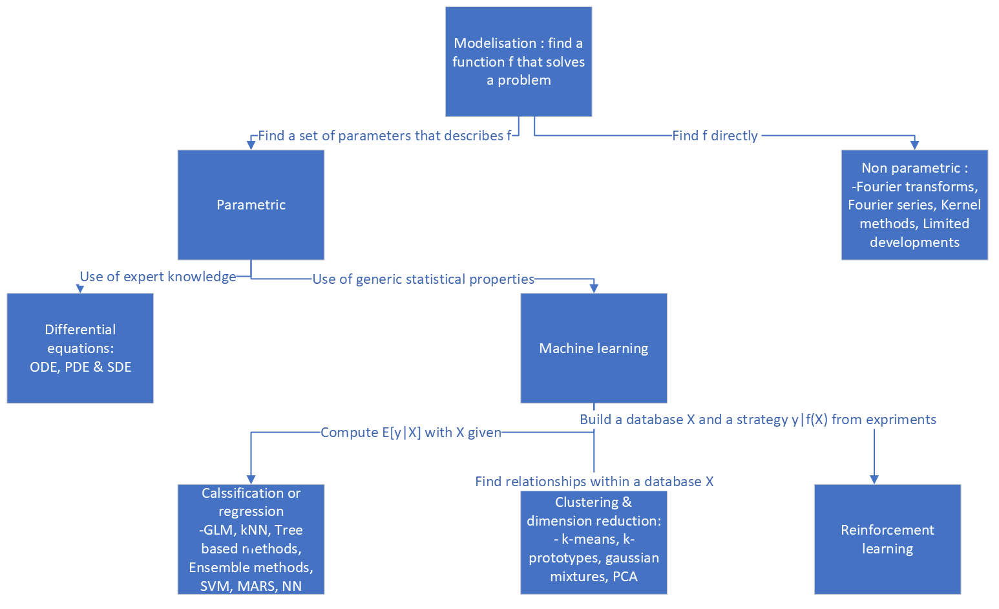

Point commun: toutes ces méthodes reposent sur des techniques d'optimisation!

Exemples:

- **Estimation non paramétrique** Les polynomes sont denses dans les fonctions continues. Supposons que $(x_1,\dots,x_d);(y_1,\dots,y_d)$ sont des points tels que $y_1 = f(x_1) \dots$ avec f continue. Alors on peut trouver des points $(a_0,\dots, a_n)$ tels que $y_{i} = a_{0} + a_{1}x_{i} + a_{2}x_{i}^{2} + \dots$ avec une erreur allant vers 0 quand n devient grand et finalement les bons $(a_0,\dots, a_n)$ sont solution de:

$$ \min_{a_0,\dots,a_n} ||
          \begin{pmatrix} 
                x_1^n & \dots & x_{1} & 1\\
                \dots &&\\
                x_d^n & \dots & x_{d} & 1\\
          \end{pmatrix}.
        \begin{pmatrix}
            a_n\\
            \dots\\
            a_{0}\\
        \end{pmatrix} - 
        \begin{pmatrix}
            y_{1}\\
            \dots\\
            y_{n}\\
        \end{pmatrix} ||^{2}$$
        

Le même style de techniques est utilisé pour les fonctions plus que continues (développements limités), les fonctions seulement périodiques (séries de Fourier) ou intégrables (transformées de Fourier).
    
    
    
    
    
- **Equations différentielles** D'après Black et Scholes, la valeur V d'actif donné se comporte de la manière déterministe suivante:

$$ \frac{\partial V}{\partial t} + \frac{\sigma^2}{2}.x^2.\frac{\partial V}{\partial x^2} + rx\frac{\partial V}{\partial x} -rV = 0$$

Il faut trouver le $\sigma$ qui permet de cadrer avec les données empiriques. On peut trouver $\sigma$ de la façon suivante: 
    
$$min_{\sigma}||V_{i}(T,K,x;\sigma)-y_{i}(T,K,x)||^{2}$$

où $V(t,K,x)$ est la solution de l'EDP précédente avec la condition terminale $V(T,K,x;\sigma)=(x-K)^{+}$ et $y_{i}(T,K,x)$ prix des options sur l'actif $V$ pour différents $K$.
    
    
    
    

- **Problème de classification**: Minimiser la précision. Typiquement on essaye de deviner si un individu va acheter notre produit (1) ou pas (0) selon son profil. On dispose d'informations sur n individus, à savoir leur sexe, leur âge etc. et la réponse y. On cherche une fonction $f:\mathbf{R}^{d}\mapsto \{0,1\}$ qui aux informations $x\in \mathbf{R}^{d}$ associe la réponse 0 ou 1. On pose alors un problème du type:

    $$min_{\beta \in \mathbf{R}^{d}} \frac{1}{n}\sum 1_{f(x_i)\ne y_i} $$
    

Avec par exemple la fonction logistique:
 
$$ f(x):= \left\{ 
        \begin{array}{rcr} 
            1 & \text{ si } \frac{ e^{<x|\beta>} }{1 + e^{<x|\beta>} } \ge \frac{1}{2}\\
            0 & \text{ sinon }\\
        \end{array}
    \right. 
$$

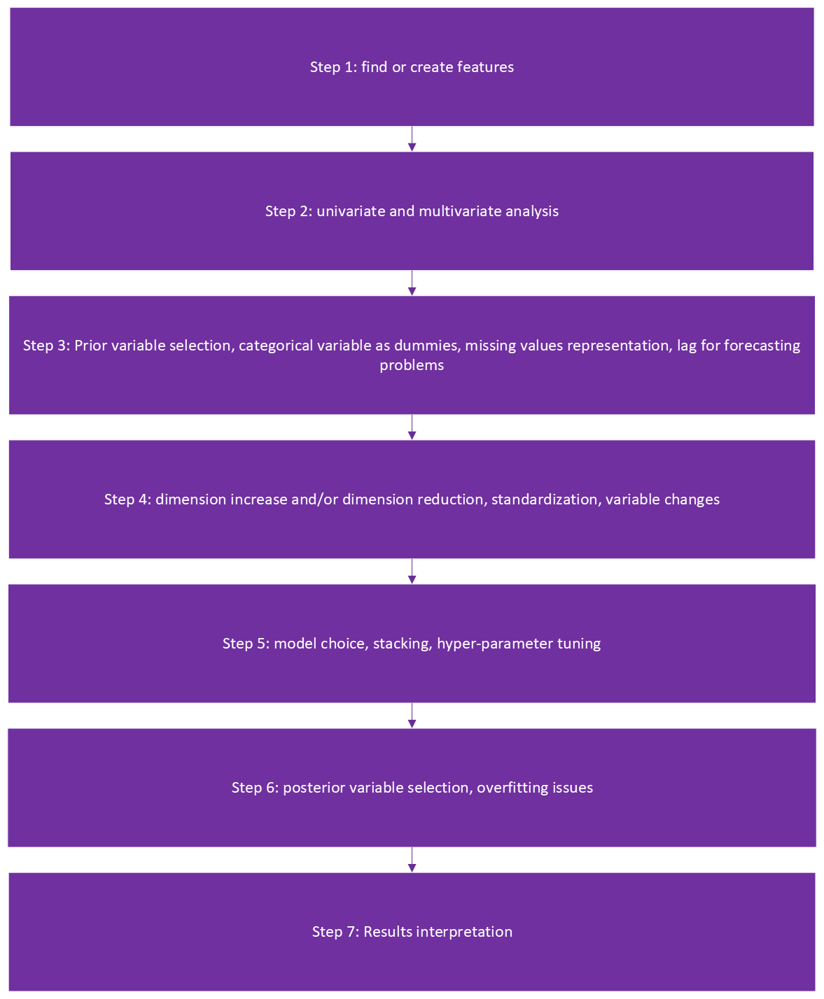

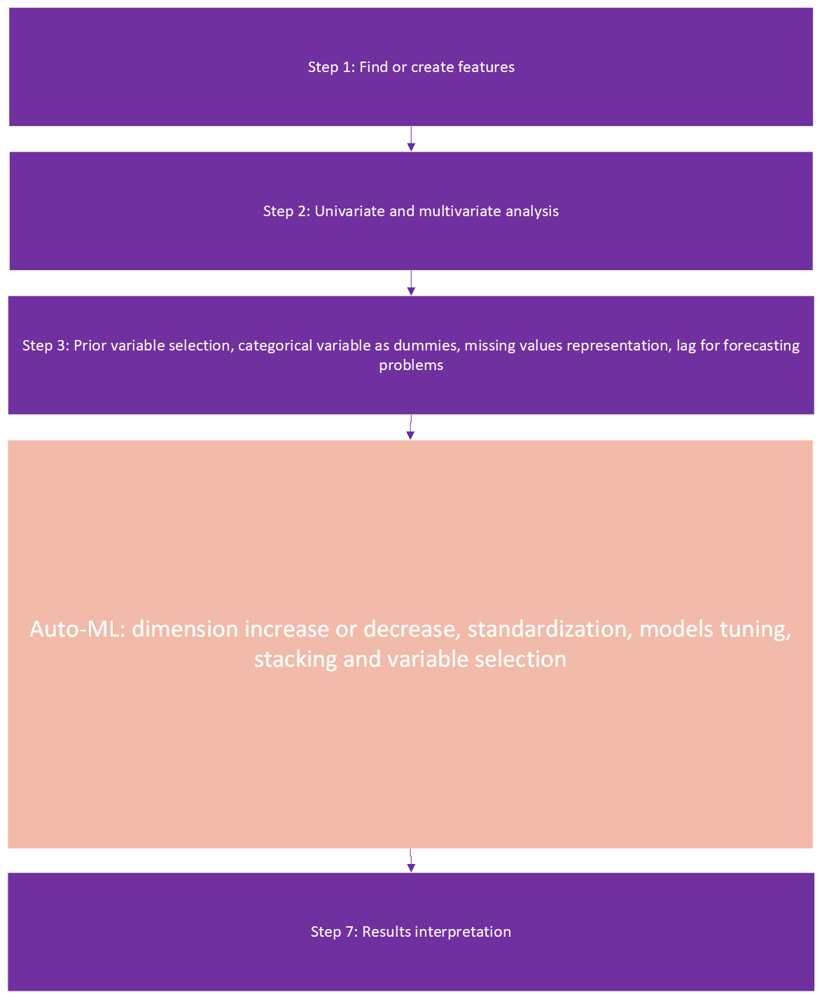

# Importation des variables


In [ ]:
url_datatypes = "https://raw.githubusercontent.com/louis75020/ML-for-business/Regression-model/data_type.csv"
#print(url_datatypes)


try:
    df_datatypes = pd.read_csv(url_datatypes, sep = ';', header = 0)
except:
    print("Problème de lecture!! Vérifie le lien banane!")

# check
df_datatypes

,VarName,Type
0,Id,object
1,Response_Market_Index,float64
2,PROD_Formula,object
3,PER_sex,object
4,PER_Sex_Second_Driver,object
5,VEH_Actual_Value,float64
6,CLA_HISTORY,float64
7,CLA_HISTORY_1Y,float64
8,CLA_HISTORY_3Y,float64
9,CLA_BM_TPL_DECLARED,float64


In [ ]:
def get_types_dictionnary (dataframe = df_datatypes) :

  keys = dataframe['VarName']
  values = dataframe['Type']

  return dict( zip(keys, values) )

In [ ]:
datatypes = get_types_dictionnary() #datatypes
url_insurance_data = "https://raw.githubusercontent.com/louis75020/ML-for-business/Regression-model/data_train_insurance.csv" #link

try:
  df_insurance = pd.read_csv( url_insurance_data, 
                              sep = ";",
                              header = 0,
                              dtype = datatypes,
                              na_values = ['?'],
                              keep_default_na = True,
                              #encoding = "iso-8859-1" 
                              )
except:
  print("Problème de lecture!! Vérifie le lien banane!")
  
#check
df_insurance.head()


,Id,Response_Market_Index,PROD_Formula,PER_sex,PER_Sex_Second_Driver,VEH_Actual_Value,CLA_HISTORY,CLA_HISTORY_1Y,CLA_HISTORY_3Y,CLA_BM_TPL_DECLARED,...,VEH_pw_proportion,VEH_High_Risk_Vehicle,PER_previous_insurer,PER_Is_second_driver,PER_Age_oldest_child,PER_Second_Driver_Age,PER_Insured_Before,VEH_Weight,GEO_Lat,GEO_Long
0,1638099,435.0,BASIC,2,0,4600.0,1.0,1.0,1.0,1.0,...,59.0,2,5,1,-99.0,-1.0,2,1125.0,-1.790876,-0.431147
1,1657342,609.0,FULL,1,0,68315.0,1.0,1.0,1.0,2.0,...,106.0,2,17,1,2.0,-1.0,2,1510.0,1.675824,-4.431147
2,1657529,609.0,FULL,1,0,68315.0,1.0,1.0,1.0,2.0,...,106.0,2,17,1,2.0,-1.0,2,1510.0,1.675824,-4.431147
3,1662071,404.0,FULL,1,2,11005.0,1.0,1.0,1.0,2.0,...,51.0,2,6,2,1.0,31.0,2,1170.0,-0.440876,1.285553
4,1662074,404.0,FULL,1,2,11005.0,1.0,1.0,1.0,2.0,...,51.0,2,6,2,1.0,31.0,2,1170.0,-0.440876,1.285553


**NB**

Ce notebook est un support de formation.
A des fins didactiques; on ne travaillera qu'avec un nombre limité de variables préselectionnées. Le notebook entier est dispo:
https://github.com/louis75020/ML-for-business/blob/Regression-model/ML_for_business_1.ipynb

In [ ]:
X = df_insurance[["BEH_Number_Year_Insured",
                  "CLA_BM",
                  "PER_License_Age_Main_Driver",
                  "PER_Age_Main_Driver",
                  "VEH_Top_Speed",
                  "CLA_BM_TPL_DECLARED",
                  "VEH_engine_HP",
                  "PER_sex"]]

y = df_insurance["Response_Market_Index"]

# Analyse univariée

## Split

**TRAIN TEST SPLIT DIRECT: ne pas fausser ses décisions à partir d'informations dont nous ne sommes pas sensés disposer!**

In [ ]:
Xtrain, Xtest, ytrain, ytest = train_test_split(X, y, test_size=0.25)

## Stats descriptives

In [ ]:
Xtrain.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7487 entries, 3745 to 8767
Data columns (total 8 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   BEH_Number_Year_Insured      7451 non-null   float64
 1   CLA_BM                       7451 non-null   float64
 2   PER_License_Age_Main_Driver  7451 non-null   float64
 3   PER_Age_Main_Driver          7451 non-null   float64
 4   VEH_Top_Speed                7451 non-null   float64
 5   CLA_BM_TPL_DECLARED          7451 non-null   float64
 6   VEH_engine_HP                7451 non-null   float64
 7   PER_sex                      7487 non-null   object 
dtypes: float64(7), object(1)
memory usage: 526.4+ KB


- BEH_Number_Year_Insured : Le nombre d'années que la voiture est assurée
- PER_License_Age_Main_Driver : Le nombre d'années que le conducteur a son permis
- PER_Age_Main_Driver: L'âge de l'assuré
- VEH_Top_Speed: La vitesse de pointe de la voiture
- CLA_BM: Nombre de sinistres 
- CLA_BM_TPL_DECLARED: Nombre de sinistres sur un tiers
- VEH_engine_HP: Le nombre de chevaux de la voiture
- PER_sex: sexe de l'assuré


In [ ]:
Xtrain.head()

,BEH_Number_Year_Insured,CLA_BM,PER_License_Age_Main_Driver,PER_Age_Main_Driver,VEH_Top_Speed,CLA_BM_TPL_DECLARED,VEH_engine_HP,PER_sex
3745,10.0,10.0,26.0,56.0,190.0,1.0,115.0,1
3194,9.0,9.0,13.0,31.0,160.0,1.0,86.0,1
5378,10.0,10.0,27.0,57.0,200.0,1.0,115.0,1
3724,10.0,10.0,26.0,45.0,157.0,1.0,68.0,1
7018,3.0,3.0,10.0,30.0,197.0,7.0,115.0,1


In [ ]:
Xtrain.describe()

,BEH_Number_Year_Insured,CLA_BM,PER_License_Age_Main_Driver,PER_Age_Main_Driver,VEH_Top_Speed,CLA_BM_TPL_DECLARED,VEH_engine_HP
count,7451.000000,7451.000000,7451.000000,7451.000000,7451.000000,7451.000000,7451.000000
mean,6.490136,6.445041,16.859482,38.256476,187.491612,1.654275,116.171789
std,3.952130,3.762233,11.537728,12.158632,24.402861,2.180063,42.038848
min,-1.000000,0.000000,0.000000,18.000000,0.000000,-1.000000,24.000000
25%,3.000000,3.000000,8.000000,29.000000,175.000000,1.000000,90.000000
50%,8.000000,7.000000,15.000000,35.000000,187.000000,1.000000,110.000000
75%,10.000000,10.000000,24.000000,45.000000,201.000000,1.000000,140.000000
max,10.000000,10.000000,59.000000,85.000000,325.000000,12.000000,625.000000


Même nombre de missing values partout: les mêmes??

-1 en min. sur CLA_BM_TPL_DECLARED: missing values additionnelles?

## Distributions univariées

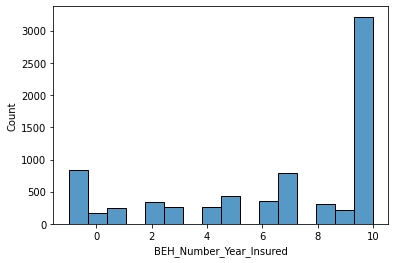

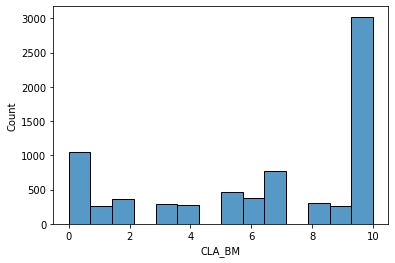

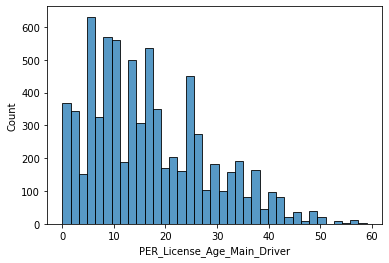

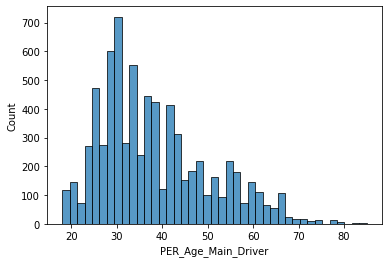

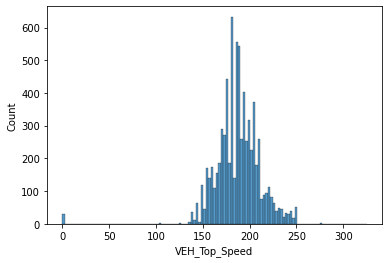

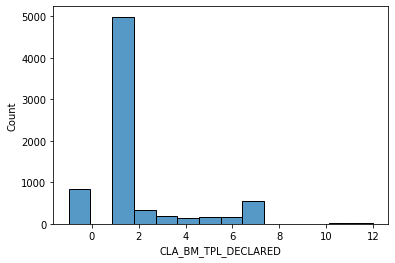

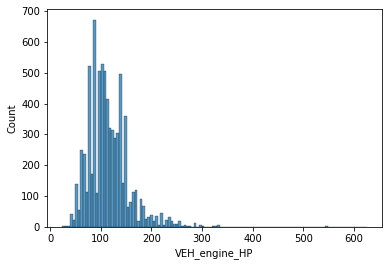

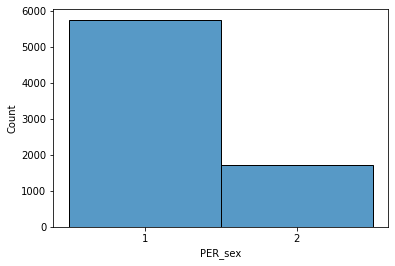

In [ ]:
tmp = list(Xtrain.columns)
for i in tmp:
    sns.histplot(Xtrain[i])
    show()

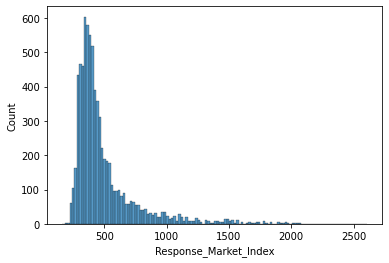

In [ ]:
sns.histplot(ytrain)

# Analyse Multivariée

## Quantitatives

### Quantitatives entre elles

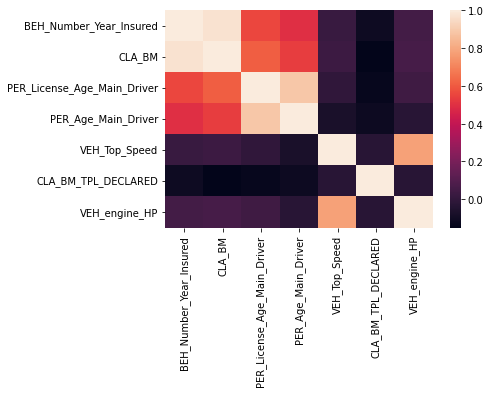

In [ ]:
# Pearson
sns.heatmap(Xtrain.corr())

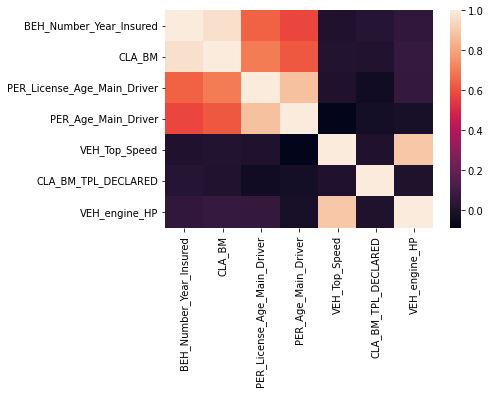

In [ ]:
#Sperman
sns.heatmap(Xtrain.corr(method = "spearman"))

### Quantitatives vs Réponse

#############Response vs BEH_Number_Year_Insured##############
_______________Smooth Scatter Plot______________


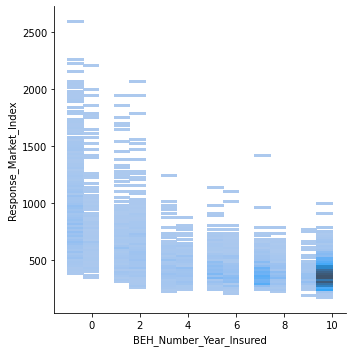

#############Response vs CLA_BM##############
_______________Smooth Scatter Plot______________


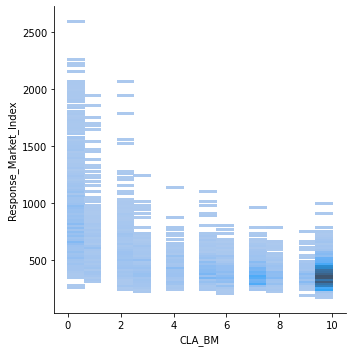

#############Response vs PER_License_Age_Main_Driver##############
_______________Smooth Scatter Plot______________


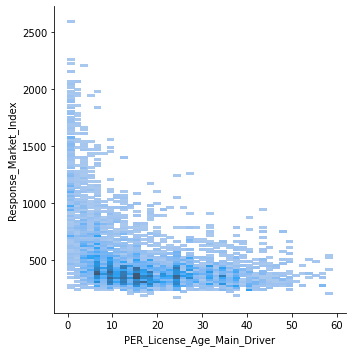

#############Response vs PER_Age_Main_Driver##############
_______________Smooth Scatter Plot______________


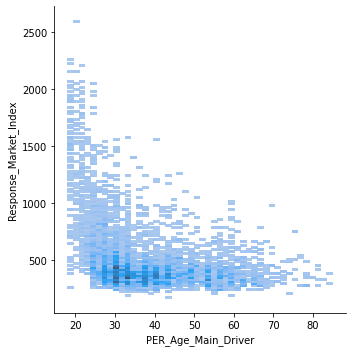

#############Response vs VEH_Top_Speed##############
_______________Smooth Scatter Plot______________


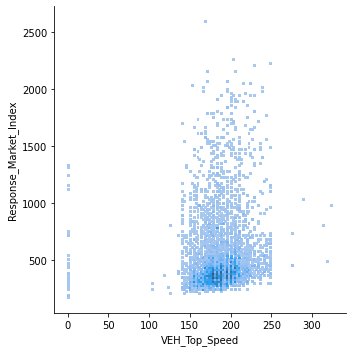

#############Response vs CLA_BM_TPL_DECLARED##############
_______________Smooth Scatter Plot______________


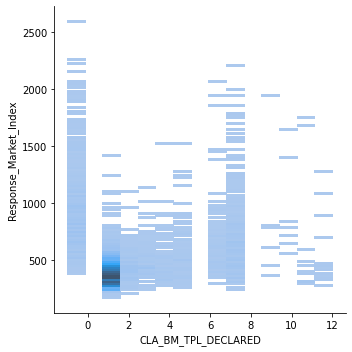

#############Response vs VEH_engine_HP##############
_______________Smooth Scatter Plot______________


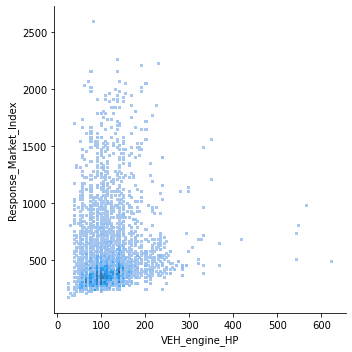

In [ ]:
quantitative = list(X.columns)
del quantitative[-1]

for variable in quantitative:
      Xy = pd.DataFrame( (X[variable], y) ).transpose()

      print("#############Response vs " + variable + "##############")

      print("_______________Smooth Scatter Plot______________")
      
      figsize(10, 10)
      ax = sns.displot(Xy, 
                  x = variable, 
                  y = "Response_Market_Index")
      show()

Nos graphes sont encourageants, on a du signal dans nos données!

## Qualitatives 

#############Response vs VEH_engine_HP##############
_____________Pivot_______________


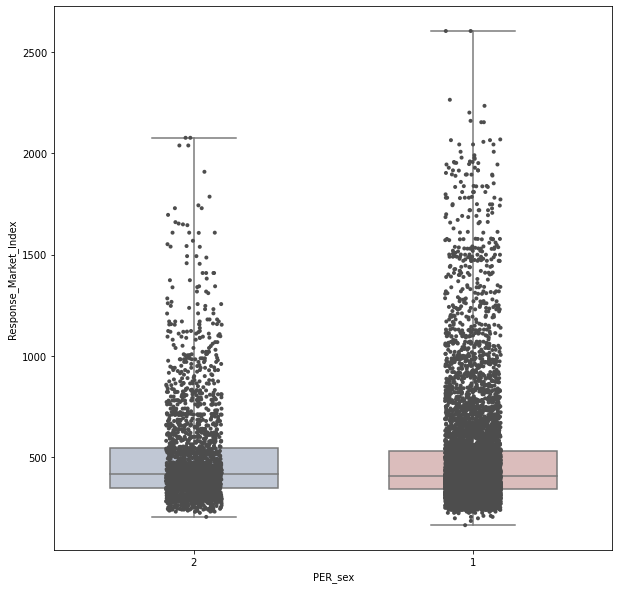

______________Conditionnal Distribution_______________


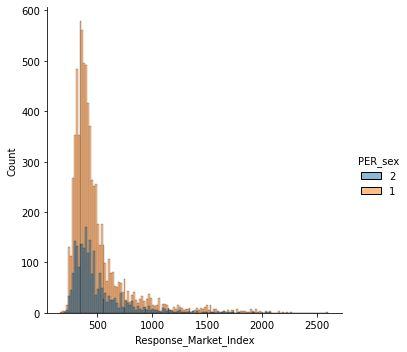

In [ ]:
Xy = pd.DataFrame( (X["PER_sex"], y) ).transpose()

print("#############Response vs " + variable + "##############")

print("_____________Pivot_______________")
figsize = (10, 10)
# Plot the orbital period with horizontal boxes
sns.boxplot(x = "PER_sex", 
            y = "Response_Market_Index", 
            data=Xy,
            whis=[0, 100], 
            width=.6, 
            palette="vlag")

# Add in points to show each observation
sns.stripplot(x = "PER_sex", 
              y = "Response_Market_Index", 
              data=Xy,
              size=4, 
              color=".3", 
              linewidth=0)
show()

print("______________Conditionnal Distribution_______________")
figsize = (10, 10)
try : 
  sns.displot(Xy, x = "Response_Market_Index", hue = "PER_sex", fill = True)
  show()
except : 
  print("C'est pas le bon code patate")

Le sexe est anecdotique (visuellement; pour drop à ce point, faire un test statistique)

## NAS

In [ ]:
Xtrain_50mv = Xtrain.loc[Xtrain['CLA_BM'].isnull()]
Xtrain_50mv.describe()

,BEH_Number_Year_Insured,CLA_BM,PER_License_Age_Main_Driver,PER_Age_Main_Driver,VEH_Top_Speed,CLA_BM_TPL_DECLARED,VEH_engine_HP
count,0.0,0.0,0.0,0.0,0.0,0.0,0.0
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,NaN,NaN,NaN,NaN,NaN,NaN,NaN
max,NaN,NaN,NaN,NaN,NaN,NaN,NaN


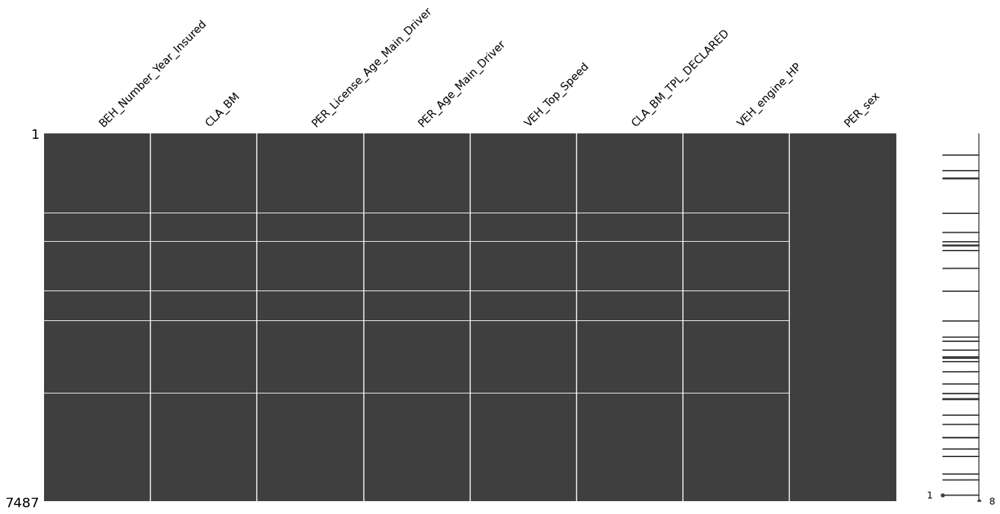

In [ ]:
missingno.matrix(Xtrain)

Les valeurs manquantes sont les mêmes!

In [ ]:
subset = Xtrain["CLA_BM"].isnull() 
subset

860     False
1245    False
728     False
9902    False
2630    False
        ...  
5315    False
9636    False
5779    False
6956    False
7380    False
Name: CLA_BM, Length: 7487, dtype: bool

In [ ]:
Xtrain2 = Xtrain.dropna()
Xtrain2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7448 entries, 860 to 7380
Data columns (total 8 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   BEH_Number_Year_Insured      7448 non-null   float64
 1   CLA_BM                       7448 non-null   float64
 2   PER_License_Age_Main_Driver  7448 non-null   float64
 3   PER_Age_Main_Driver          7448 non-null   float64
 4   VEH_Top_Speed                7448 non-null   float64
 5   CLA_BM_TPL_DECLARED          7448 non-null   float64
 6   VEH_engine_HP                7448 non-null   float64
 7   PER_sex                      7448 non-null   object 
dtypes: float64(7), object(1)
memory usage: 523.7+ KB


In [ ]:
ytrain2 = ytrain[-subset]
ytrain2.describe()

count    7448.000000
mean      495.410470
std       270.562628
min       183.000000
25%       342.400000
50%       408.225000
75%       533.940000
max      2604.930000
Name: Response_Market_Index, dtype: float64

# ML pipepline

**Définition: pipeline**

On appelle un pipeline une série d'opérations à effectuer sur un dataset (avec un nombre d'individus arbitraires mais un nombre de variables fixe). En général, le pipeline tournera sur au moins 3 bases de données: le train, la validation et le test. Il n'est entrainé que sur le train.

Voici un exemple de pipeline en python:

0: Preprocessing 1: encodage des valeurs manquantes, encodage des variables catégorilles

1: PCA (réduction de la dimension à 3 et centrage/réduction des données)

2: RF

In [ ]:
class TESTPipeline():
    
    PCA_engine = None
    SVC_engine = None
    
    def __init__(self, scale = False, n_estimators = 100, max_depth = None):
        #NANS
        self.Imputer_engine1 = SimpleImputer(missing_values = nan, strategy = 'mean')
        self.Imputer_engine2 = SimpleImputer(missing_values = nan, strategy ='most_frequent')
        #Scale
        self.Scaler_engine = StandardScaler()
        self.scale = scale
        #SVM
        self.RF_engine = RandomForestRegressor(n_estimators = n_estimators, max_depth = max_depth, criterion = "mse") 
        
        

    ############
    ###Private
    ############

    def _split(self, X):
        X1 = X.copy()
        X1["PER_sex"] = array(X1["PER_sex"] == "1", dtype = "i")
        X2 = array(X1["PER_sex"]).reshape(-1, 1)
        del X1["PER_sex"]
        return X1, X2

    def _processor(self, X):
        X1, X2 = self._split(X)
        self.Imputer_engine1.fit(X = X1)
        self.Imputer_engine2.fit(X = X2)
        X1["PER_sex"] = X2
        self.Scaler_engine.fit(X = X1)

    
    def _fit_model(self, X, y):
        self.RF_engine.fit(X, y)

    ############
    ###Preprocessing
    ############
        
    def transform(self, X):
        X1, X2 = self._split(X)
        X1 = self.Imputer_engine1.transform(X1)
        X2 = self.Imputer_engine2.transform(X2)
        output = concatenate((X1, X2), axis = 1)
        if self.scale :
          return self.Scaler_engine.transform(output)
        else: 
          return output

    ############
    ###Fitting
    ############
        
    def fit(self, X, y):
        self._processor(X)
        Xtemp = self.transform(X)
        self._fit_model(Xtemp, y)
        
    def fit_transform(self, X, y):
        self.fit(X, y)
        return self.transform(X)

    ############
    ###Predicting
    ############
    
    def predict(self, X):
        Xtemp = self.transform(X)
        return self.RF_engine.predict(Xtemp)

    def fit_predict(self, X, y):
        self.fit(X, y)
        return self.predict(X)
    

In [ ]:
test_pipeline = TESTPipeline()
test_pipeline.fit(Xtrain2, ytrain2)

In [ ]:
print("Calibration score:")
print(mean_squared_error(ytrain2, test_pipeline.predict(Xtrain2)))

Calibration score:
2086.6420751573733


In [ ]:
print("Test score:")
print(mean_squared_error(ytest, test_pipeline.predict(Xtest)))

Test score:
8069.449374740342


**Un autre pipeline inspiré du 1er**

In [ ]:
class TESTPipeline2():

  def __init__(self, alpha = 0.5):

    self.pipeline1 = TESTPipeline(scale = True)
    self.Lasso_engine = Lasso(alpha = alpha)

    def fit(self, X, y):
      self.pipeline1.fit(X, y)
      Xtemp = self.pipeline1.transform(X)
      self.Lasso_enine.fit(Xtemp, y)

    def transform(self, X):
      return self.pipeline1.transform(X)

    def fit_transform(self, X, y):
      self.fit(X, y)
      return self.transform(X)

    def predict(self, X):
      Xtemp = self.transform(X)
      return self.Lasso_engine.predict(X) 

    def fit_predict(self, X, y):
        self.fit(X, y)
        return self.predict(X)

In [ ]:
test_pipeline2 = TESTPipeline()
test_pipeline2.fit(Xtrain2, ytrain2)

In [ ]:
print("Calibration score:")
print(mean_squared_error(ytrain2, test_pipeline2.predict(Xtrain2)))

Calibration score:
2070.068700167618


In [ ]:
print("Test score:")
print(mean_squared_error(ytest, test_pipeline2.predict(Xtest)))

Test score:
8154.993006104597


# Stacking

Notion de stacking:

Supposons que nous avons crée d pipelines de machine learning (2 dans l'exemple ci-dessous).

Par exemple (scaler = Fale, RF,...) et (scaler = True, Lasso, lambda=1)

Ou (scaler = True, Lasso, lambda=1) et (scaler = True, Lasso, lambda=2)

Il peut être intéressant d'agréger les 2 plutôt qu'en retenir un et jeter l'autre:

- Si un modèle sur-estime et un autre sous-estime
- Une courbe convexe et une courbe concave alors que la tendance des résidus est linéaire etc.

Dans ce cas on retient le modèle $\lambda y_1 + \mu y_2$: on prédit une combinaison linéaire de nos prédictions. 

**Statique**: on a entraîné nos modèles 1 et 2 et on a juste à proposer des valeurs pour $\lambda$ et $\mu$

- Allocation proportionnelle
- Modèle linéaire

In [ ]:
ex_stacking = zeros((len(ytrain2), 2))
ex_stacking[:,0] = test_pipeline2.predict(Xtrain2)
ex_stacking[:,1] = test_pipeline.predict(Xtrain2)

ex_stackingT = zeros((len(ytest), 2))
ex_stackingT[:,0] = test_pipeline2.predict(Xtest)
ex_stackingT[:,1] = test_pipeline.predict(Xtest)

In [ ]:
stacked_model = LinearRegression()
stacked_model.fit(ex_stacking, ytrain2)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [ ]:
print("Calibration score:")
print(mean_squared_error(ytrain2, stacked_model.predict(ex_stacking)))

Calibration score:
2008.5101294969002


In [ ]:
print("Calibration score:")
print(mean_squared_error(ytest, stacked_model.predict(ex_stackingT)))

Calibration score:
8108.8822205913275


Idée:

Si on sait déjà qu'on va stacker des modèles, on peut non seulement trouver $\lambda$ et $\mu$ mais aussi $y_1$ et $y_2$! On peut faire dépendre les modèles à stacker les uns les autres!!!

# Auto-sklearn

In [ ]:
Xtrain3 = test_pipeline.transform(Xtrain2)
Xtest = test_pipeline.transform(Xtest)

In [ ]:
X_train, Xval, y_train, yval = train_test_split(Xtrain3, ytrain2, test_size = 0.3)

On cherche à créer un pipeline "sans intervention humaine arbitraire".

En pratique, pour limiter l'impact des choix du data scientist; on teste:

- Tous les meta-features possibles (on part de la BD X, et on en déduit différents datasets en appliquant des transformations différentes comme la standardisation, la machine de Boltzman (max - x)/(max - min), l'ACP pour différentes valeurs de "n_components"...)

- Pour chacun de ces datasets on teste l'ensemble des méta-modèles existants (ML, SVM, random forstes, gradient boosté, réseaux de neurones etc.)

- Chacun de ces modèles dépend d'hyperparamètres donc on teste chacun des méta-modèles pour différentes valeurs de ces hyperparamètres. On teste différentes combinaisons $(\lambda_{LASSO}, \mu_{Ridge})$ pour le modèle linéaire, pour un SVM on teste différénets noyaux (RBF, gaussien, linéaire, sigmoid) , termes de régularisation du noyau (le sigma du noyau gaussien...) et termes d'erreurs (le C), pour les Random forests on teste différentes profondeurs et différents nombre de feuilles etc.

On veut essayer de créer un unique pipeline le plus performant parmi une série à tester (série qui peut être décidée arbitrairement).

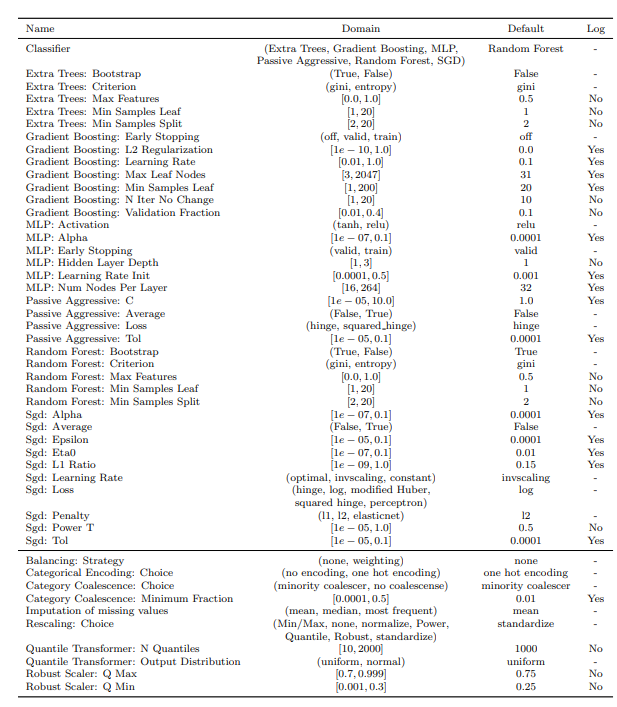

**Référence Bibliographique importante**

Auto-Sklearn 2.0: Hands-free AutoML via Meta-Learning

Matthias Feurer, Katharina Eggensperger, Stefan Falkner, Marius Lindauer, Frank Hutter

arXiv:2007.04074

https://ml.informatik.uni-freiburg.de/wp-content/uploads/papers/21-ARXIV-ASKL2.pdf

Cet article est quasi à 100% inspiré par auto-sklearn v.1 et surtout la version keras auto-keras pour les réseaux de neurones Google:

M. Feurer, A. Klein, K. Eggensperger, J. Springenberg, M. Blum, and F. Hutter. Autosklearn: Efficient and robust automated machine learning. In Hutter et al. (2019), pages
113–134. Available for free at http://automl.org/book.

H. Jin, Q. Song, and X. Hu. Auto-Keras: An efficient neural architecture search system. In
Proc. of KDD’19, pages 1946–1956, 2019.

L'algorithme derrière auto-sklearn:

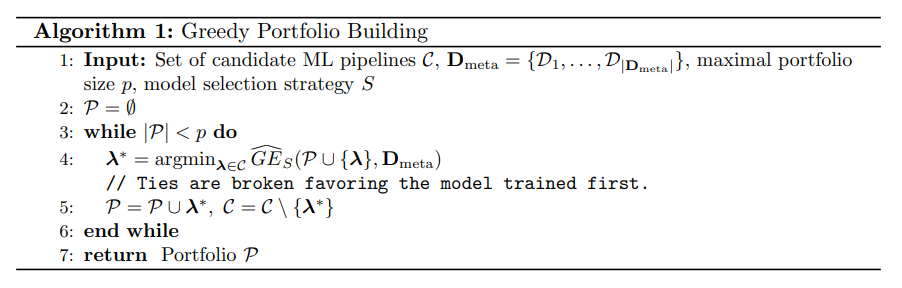

En français:

- Déjà on ne construit pas un unique modèle mais un portefeuille avec une allocation. C'est à dire que le modèle final ne sera pas nécessairement SVC(C=1, gamma="default") mais peut-être 1/2. SVC(C=1/2, gamma="default") + 1/2. LM(lambda = 0.8)

- Initialisation:

    - On se prend une série de pipelines candidats (aléatoirement ou parmi une liste de condidats par défaut, ou parmi une liste passé par l'utilisateur). Par exemple: Set = (StandardScaler, modele lineaire, lasso = 1); (StandardScaler, SVM, C = 1); (MinMaxScaler, MLP, # neurones = 50)
    
    - Un ensemble de bases de données pour faire de la cross-validation par exemple en leave one out $D_{meta} = (Xtrain, Xval)$, en stratifié (plus long mais plus performant) c'est $D_{meta} = (Xtrain1, Xval1)U(Xtrain2, Xval2)U...$
    
    - La taille maximale du portefeuille: pour interdire le stacking p=1 pour avoir 2 méta-modèles stackés p=2 etc.
    
    - Une stratégie de sélection de portefeuille: min. Accuracy? min. Erreur de 1ère espèce? ROC?
    
    Pour notre exemple, on va laisser l'ordinateur chosir les pipelines candidats, on va se placer en leave-one-out (on retient le modèle entrainé sur Xtrain qui obtient les meilleures performances sur Xval). On ne va pas stacker les modèles (même en oubliant le benchmark, on a des données propres, en petite dimension et graphiquement séparables) p = 1. Pour la stratégie de sélection on va lui passer l'accuracy.
    
- (1ère itération - unique itérartion retenue en exemple):

    - On entraîne chaque modèle parmi notre liste de candidats, on fait des prédictions sur notre base de validation, on retient le modèle ayant la meilleure précision sur la base de validation.
    - On ajoute à notre portefeuille le portefeuille ayant la meilleure précision sur la base de validation.
    
- kième itération (procédure forward):

    - On entraîne notre portefeuille stacké avec chacun (un par un) des modèles parmi notre liste de candidats (sauf ceux déjà dans le portefeuille), on fait des prédictions sur notre base de validation, on retient le modèle ayant la meilleure précision sur la base de validation.
    - On ajoute à notre portefeuille le portefeuille ayant la meilleure précision sur la base de validation.
    
Pourquoi ça marche quand même pas mal? Parce que pour les contraintes $L^1$ et $L^2$, et en fait l'ensemble des choix de paramètres de régularisation peuvent être passés en "auto", c'est à dire qu'il n'y a pas besoin de donner une valeur au $\lambda$ pour faire du Lasso en python. Aussi les hyperparamètres les plus intéressants (testés sur de nombreux problèmes de références sont passés en mémoire dans l'objet.

In [ ]:
autoPipeline_sklearn = autosklearn.regression.AutoSklearnRegressor( ensemble_size = 1,
                                                                    time_left_for_this_task = 1800,
                                                                    n_jobs = -1 )


autoPipeline_sklearn.fit( X=X_train, 
                          y=y_train, 
                          X_test=Xval, 
                          y_test=yval)



/usr/local/lib/python3.7/dist-packages/distributed/node.py:182: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 36577 instead
  f"Port {expected} is already in use.\n"
/usr/local/lib/python3.7/dist-packages/sklearn/base.py:197: FutureWarning: From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.
  FutureWarning)


AutoSklearnRegressor(dask_client=None,
                     delete_output_folder_after_terminate=True,
                     delete_tmp_folder_after_terminate=True,
                     disable_evaluator_output=False, ensemble_nbest=50,
                     ensemble_size=1, exclude_estimators=None,
                     exclude_preprocessors=None, get_smac_object_callback=None,
                     include_estimators=None, include_preprocessors=None,
                     initial_configurations_via_metalearning=25,
                     load_models=None, logging_config=None,
                     max_models_on_disc=50, memory_limit=3072,
                     metadata_directory=None, metric=None, n_jobs=-1,
                     output_folder=None, per_run_time_limit=360,
                     resampling_strategy='holdout',
                     resampling_strategy_arguments=None, seed=1,
                     smac_scenario_args=None, time_left_for_this_task=1800,
                     tmp_folder

In [ ]:
pprint(autoPipeline_sklearn.show_models(), indent=4)

('[(1.000000, '
 "SimpleRegressionPipeline({'data_preprocessing:categorical_transformer:categorical_encoding:__choice__': "
 "'no_encoding', "
 "'data_preprocessing:categorical_transformer:category_coalescence:__choice__': "
 "'minority_coalescer', "
 "'data_preprocessing:numerical_transformer:imputation:strategy': 'mean', "
 "'data_preprocessing:numerical_transformer:rescaling:__choice__': "
 "'standardize', 'feature_preprocessor:__choice__': 'no_preprocessing', "
 "'regressor:__choice__': 'extra_trees', "
 "'data_preprocessing:categorical_transformer:category_coalescence:minority_coalescer:minimum_fraction': "
 "0.006136459298464629, 'regressor:extra_trees:bootstrap': 'False', "
 "'regressor:extra_trees:criterion': 'friedman_mse', "
 "'regressor:extra_trees:max_depth': 'None', "
 "'regressor:extra_trees:max_features': 0.9490464657381125, "
 "'regressor:extra_trees:max_leaf_nodes': 'None', "
 "'regressor:extra_trees:min_impurity_decrease': 0.0, "
 "'regressor:extra_trees:min_samples_l

In [ ]:
profiler_data = PipelineProfiler.import_autosklearn(autoPipeline_sklearn)
PipelineProfiler.plot_pipeline_matrix(profiler_data)

In [ ]:
print("Calibration Score:")
print(mean_squared_error(autoPipeline_sklearn.predict(Xtrain3), ytrain2))
print("Test Score:")
print(mean_squared_error(autoPipeline_sklearn.predict(Xtest), ytest))

Calibration Score:
8292.772391474364
Test Score:
12171.26804884693


In [ ]:
autoPipeline_sklearn = autosklearn.regression.AutoSklearnRegressor( time_left_for_this_task = 3600,
                                                                    n_jobs = -1 )

autoPipeline_sklearn.fit( X=X_train, 
                          y=y_train, 
                          X_test=Xval, 
                          y_test=yval)

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:197: FutureWarning: From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.
  FutureWarning)


AutoSklearnRegressor(dask_client=None,
                     delete_output_folder_after_terminate=True,
                     delete_tmp_folder_after_terminate=True,
                     disable_evaluator_output=False, ensemble_nbest=50,
                     ensemble_size=50, exclude_estimators=None,
                     exclude_preprocessors=None, get_smac_object_callback=None,
                     include_estimators=None, include_preprocessors=None,
                     initial_configurations_via_metalearning=25,
                     load_models=None, logging_config=None,
                     max_models_on_disc=50, memory_limit=3072,
                     metadata_directory=None, metric=None, n_jobs=-1,
                     output_folder=None, per_run_time_limit=720,
                     resampling_strategy='holdout',
                     resampling_strategy_arguments=None, seed=1,
                     smac_scenario_args=None, time_left_for_this_task=3600,
                     tmp_folde

In [ ]:
pprint(autoPipeline_sklearn.show_models(), indent=4)

('[(0.320000, '
 "SimpleRegressionPipeline({'data_preprocessing:categorical_transformer:categorical_encoding:__choice__': "
 "'one_hot_encoding', "
 "'data_preprocessing:categorical_transformer:category_coalescence:__choice__': "
 "'minority_coalescer', "
 "'data_preprocessing:numerical_transformer:imputation:strategy': 'mean', "
 "'data_preprocessing:numerical_transformer:rescaling:__choice__': "
 "'standardize', 'feature_preprocessor:__choice__': 'fast_ica', "
 "'regressor:__choice__': 'random_forest', "
 "'data_preprocessing:categorical_transformer:category_coalescence:minority_coalescer:minimum_fraction': "
 "0.010000000000000004, 'feature_preprocessor:fast_ica:algorithm': "
 "'deflation', 'feature_preprocessor:fast_ica:fun': 'logcosh', "
 "'feature_preprocessor:fast_ica:whiten': 'True', "
 "'regressor:random_forest:bootstrap': 'True', "
 "'regressor:random_forest:criterion': 'mse', "
 "'regressor:random_forest:max_depth': 'None', "
 "'regressor:random_forest:max_features': 0.96368

In [ ]:
profiler_data = PipelineProfiler.import_autosklearn(autoPipeline_sklearn)
PipelineProfiler.plot_pipeline_matrix(profiler_data)

In [ ]:
print("Calibration Score:")
print(mean_squared_error(autoPipeline_sklearn.predict(Xtrain3), ytrain2))
print("Test Score:")
print(mean_squared_error(autoPipeline_sklearn.predict(Xtest), ytest))

Calibration Score:
7028.588393371767
Test Score:
11686.332796760767


# Algorithme génétique


**Un problème d'optimisation**
    
Objectif: minimiser $f:\mathbf{R}^d\mapsto\mathbf{R}$ sous la contrainte $x \le \phi(x) \in \mathbf{R}^{d}$ et on suppose que c'est trop compliqué pour essayer de le résoudre à la main.
        
$$ \min_{x \le \phi(x)} f(x) $$
        
Pour aujourd'hui on supposera qu'on peut réecrire le problème sous la forme (sans contrainte):
        
$$ \min_{x \in \mathbf{R}^{d}} f(x) + \sum_{i=1}^{d} \lambda_{i}\phi(x_{i}) $$
        
Problèmes:

- Si $f \in \mathcal{C}^{2}$, méthode de Newton; si $f\in \mathcal{C}^{1}$, descente de gradient. Comment fait-on si $f$ n'est même pas continue?
- Si $f \in \mathcal{C}^{1}$ mais que le minimum n'est pas unique (il y a des minima locaux). La descente de gradient renverra le minimum local le plus proche du point de départ.

    
**Idée naïve** On prend des points au hasard ou uniformément, on applique f; on regarde quel est le point le plus prometteur et on le retient comme point de minimum. C'est le point de départ d'un algorithme évolutionnaire. Simplement plutôt que de prendre des points arbitraires, on part d'un petit nombre de points arbitraires puis on en rajoute au fur et à mesure à l'aide de méthodes non arbitraires.



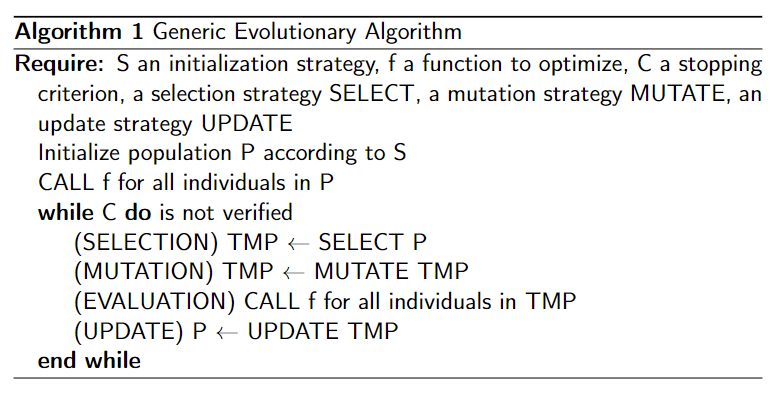

**Exemples:** GA, DE, CMAES

J. H. Holland, Adaptation In Natural And Artificial Systems, University of Michigan Press (1975)
« La robotique évolutionniste » dans Pour la Science, no 284, p. 70 (juin 2001)

Déroulé d'un algorithme génétique:

- f fixée c'est la fonction qu'on cherche à optimiser

- S c'est la stratégie d'initialisation. On peut prendre "z-aléatoire" on prend z points au hasard dans $\mathbf{R}^{d}$. On les notera $x^0_1,\dots,x^0_{z}$ tels que $f(x^0_1)\le\dots\le(x^0_{z})$

- C le critère d'arrêt: par exemple $(x^n_1,\dots,x^n_{z}) = (x^{n+1}_1,\dots,x^{n+1}_{z})$, les z individus retenus sont les mêmes d'une génération sur l'autre. 

- (SELECT): On choisit au hasard z/2 couples de 2 individus dans la population $(x^n_1,\dots,x^n_{z})$. Les individus ne peuvent pas se marier avec eux-mêmes mais peuvent être polygammes. On s'arrange pour que les individus les plus prometteurs (ie ayant le score d'optimisation le plus intéressant) aient une grande probabilité d'être tirés dans chaque couple.

- (MUTATE): Pour chaque couple (x,y) dans nos z/2 couples:
    - Crossover: Avec proba $p $ on échange une coordonnée au hasard entre x et y c'est à dire on choisit au hasard $d' \in \{ 1, \dots, d \}$ et $x' = (x_1,\dots, y_{d'}, \dots, x_d); y' = (y_1,\dots, x_{d'}, \dots, y_d)$ x' et y' sont les enfants de x et y. Avec proba $1-p$: $(x',y')=(x,y)$
    - God's plan: Avec proba $p'$, on tire au hasard une valeur $z \in \mathbf{R}$ et on remplace une coordonnée de x' par z : $x'' = (x'_1,\dots, z, \dots, x'_d)$. Avec proba $(1-p')$: $x''=x'$. On répéte indépendemment l'expérience sur $y'$ pour avoir $y''$.

- (EVALUATE et UPDATE): On a maintenant les z individus de l'étape précédente et z enfants issus des z/2 couples, soit une population de 2z. On éteint z individus (d'abord les doublons, puis parmi les restants les moins adaptés par rapport à la fonction objectif).
            


Voici un exemple:

In [ ]:
data = pd.DataFrame( array([[1000, 1400, 0, 1, 0, 1/100, 1300, 1],
                            [1000, 1200, 0, 1, 0, 1/100, 1200, 1],
                            [1000, 1000, 0, 1, 0, 1/100, 900, 1],
                            [1000, 800, 0, 1, 0, 1/100, 300, 1],
                            [1000, 600, 0, 1, 0, 1/100, 100, 1]]), columns = ["S", "K", "t", "T", "q", "r", "P", "Type"]) 



In [ ]:
data

,S,K,t,T,q,r,P,Type
0,1000.0,1400.0,0.0,1.0,0.0,0.01,1300.0,1.0
1,1000.0,1200.0,0.0,1.0,0.0,0.01,1200.0,1.0
2,1000.0,1000.0,0.0,1.0,0.0,0.01,900.0,1.0
3,1000.0,800.0,0.0,1.0,0.0,0.01,300.0,1.0
4,1000.0,600.0,0.0,1.0,0.0,0.01,100.0,1.0


In [ ]:

# Inverse Fourier Transform of random variable XT|Xt=x,vt=v

def IFT_XT_vtXt(xi, v, t, T, kappa, theta, sigma, rho, gamma):

    i = complex(0,1)

    #xi real number to be integrated
    #x asset value in t
    #v variance process value in t
    #t startin date
    #T maturity
    #(kappa, theta, sigma, rho, gamma) hyperparameters

    delta = sqrt((i*rho*sigma*gamma*xi - kappa)**2 + (gamma**2)*(sigma**2)*(xi**2 - i*xi))
    y1 = kappa - i*rho*sigma*gamma*xi - delta
    y2 = kappa - i*rho*sigma*gamma*xi + delta
    g = y1/y2
    C = (kappa*theta/(sigma**2)) * ( y1*(T-t) - 2*log( (1 - g*exp(-delta*(T-t))) / (1-g) ) )
    D = y1/(sigma**2) * (1 - exp(-delta*(T-t)))/(1 - g*exp(-delta*(T-t)))
    return exp(C + v*D)


# Returns Heston-Lewis price for a European option :

def lewis(St, K, t, T, q, r_t, v, kappa, theta, sigma, rho, type_o, gamma = 1):

    #St asset value in t
    #K strike
    #t startin date
    #T maturity
    #(v, kappa, theta, sigma, rho, gamma) hyperparameters for Heston diffusion
    #q: dividend yield
    #r_t: risk-free rate on [t,T]
    #type: Put or Call

    #Static variables
    i = complex(0,1)
    infinity = 1/2 * tan(pi/2 - 1e-3)
    k = log(St/K) + (T-t)*(r_t - q)

    #1d integration
    integrand = lambda xi : real(exp(i*xi*k) * IFT_XT_vtXt(xi - i/2, v, t, T, kappa, theta, sigma, rho, gamma) / (xi**2 + 1/4))
    integral = scipy.integrate.quad_vec(integrand, 0, infinity)[0]
    tmp = - (1/pi) * sqrt(St*K*exp((T-t)*(r_t + q))) * integral
    output = St*exp(-(T-t)*q) * (type_o != "Put") + K * exp(-(T-t)*r_t) * (type_o == "Put")
    return output + tmp


#ufunc heston
def heston_beta(v, kappa, theta, sigma, rho, data):
  return lewis( data["S"].values, data["K"].values, data["t"].values, data["T"].values, data["q"].values, data["r"].values, v, kappa, theta, sigma, rho, data["Type"].values, 1)

#objective function to be optimized
def objective_heston(x, data = data):
    return 0.5 * linalg.norm(data["P"].values - heston_beta(*x, data))**2


In [ ]:
feller = lambda x : array([x[3]**2 - 2 * x[1] * x[2]])
c = scipy.optimize.NonlinearConstraint(feller, -10, -1e-16)

r = scipy.optimize.differential_evolution(func = objective_heston,
                                          bounds = [(1e-16, 10), (1e-16, 10), (1e-16, 10), (1e-16, 10), (-1 + 1e-16, 1 - 1e-16)],
                                          maxiter = 50)
                                          #constraints = (c))
print(r)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
/usr/local/lib/python3.7/dist-packages/scipy/optimize/optimize.py:697: RuntimeWarning: invalid value encountered in double_scalars
  df = (f(*((xk + d,) + args)) - f0) / d[k]


     fun: 94822.14541298866
     jac: array([  77646.99985273,  396304.73329453,  428757.00455625,
       -942454.58603837,  385029.88754772])
 message: 'Maximum number of iterations has been exceeded.'
    nfev: 3993
     nit: 50
 success: False
       x: array([5.36983883, 7.21152017, 8.23968586, 8.05313265, 0.52958549])


# Genetic-based autoML

Trang T. Le, Weixuan Fu and Jason H. Moore (2020). Scaling tree-based automated machine learning to biomedical big data with a feature set selector. Bioinformatics.36(1): 250-256.


Dans l'idée c'est pareil que pour auto-sklearn.

La différence vient principalement de la procédure:

 - On part de la même liste de modèles possibles mais on n'en prend qu'une partie moins importante (par exemple on se fixe à 50).

 - On était dans une procédure forward: on entraîne tous les modèles, on retient le meilleur qu'on ajoute au portefeuille avec une allocation 1, puis on entraîne tous les modèles non retenus à l'étape 1 stackés avec le modèle de l'étape 1 (on utilise un algorithme d'optimisation déterministe pour trouver l'allocation entre le modèle 1 et tous les autres modèles qui sont ré-entrainés à cause des interactions avec le modèle 1) et on ajoute au portefeuille le modèle 2 qui est celui qui a le meilleur score une fois stacké avec le modèle 1 etc.

 - Ici, dès l'étape 1 on stack tous les modèles de la population initiale à l'aide de l'algorithme génétique (lancé 5 fois pour différents jeux d'hyperparamètres), puis on ajoute des modèles non testés, on relance l'algorithme génétique sur l'ensemble des modèles (anciens + nouveaux) sous la contrainte que le nombre d'allocations non nulles est la taille de la population intiale etc.
 
 
 La doc:
 http://epistasislab.github.io/tpot/api/

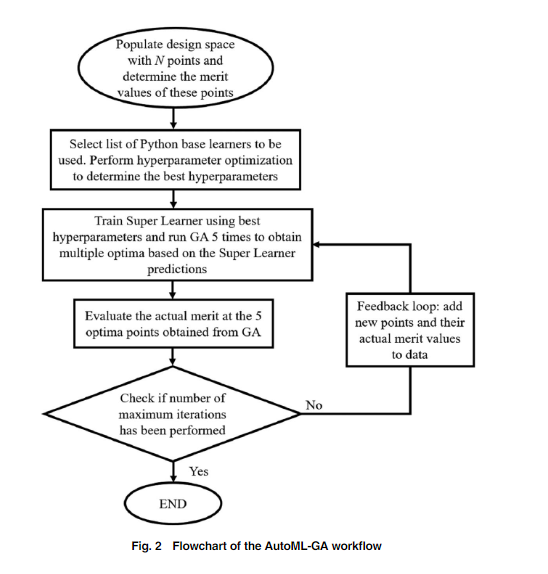

In [ ]:
model = tpot.TPOTRegressor( #subsample = 0.75, #pour n'entrainer que sur une partie de la base pour speed-up
                            # cv = 10, #défaut 5 pour augmenter le nombre de strates dans la validation croisée
                            generations = 5, #défaut 100, nombre de générations max
                            verbosity = 2, #0 à 4 selon le niveau de bavardage souhaité
                            max_time_mins = 3600, #Nombre de minutes max pour l'entraînement
                            n_jobs = -1,
                            early_stop = 10, #earky_stop pour speed-up si les progrès ne sont pas asse rapides
                            warm_start = True, #Pour optimisation avec interruptions
                            periodic_checkpoint_folder = "TPOT_checkpoint" )

In [ ]:
model.fit(Xtrain3, ytrain2)

Optimization Progress:   0%|          | 0/100 [00:00<?, ?pipeline/s]


Generation 1 - Current best internal CV score: -10403.517089885878

Generation 2 - Current best internal CV score: -10344.838312070746

Generation 3 - Current best internal CV score: -9781.752146726207

Generation 4 - Current best internal CV score: -9781.752146726207

Generation 5 - Current best internal CV score: -9781.752146726207

Best pipeline: KNeighborsRegressor(AdaBoostRegressor(input_matrix, learning_rate=0.1, loss=linear, n_estimators=100), n_neighbors=31, p=1, weights=distance)


TPOTRegressor(early_stop=10, generations=5, max_time_mins=3600, n_jobs=-1,
              periodic_checkpoint_folder='TPOT_checkpoint', verbosity=2,
              warm_start=True)

In [ ]:
print("Calibration Score:")
print(mean_squared_error(model.predict(Xtrain3), ytrain2))
print("Test Score:")
print(mean_squared_error(model.predict(Xtest), ytest))

Calibration Score:
1254.8843081934842
Test Score:
7429.1607414347


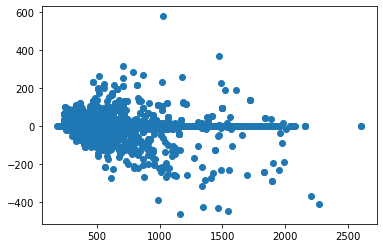

In [ ]:
scatter(ytrain2, model.predict(Xtrain3)-ytrain2)

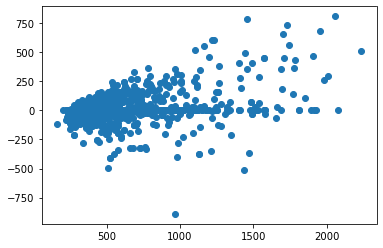

In [ ]:
scatter(ytest, ytest - model.predict(Xtest))

In [ ]:
model.generations = 10
model.fit(Xtrain3, ytrain2)

Optimization Progress:   0%|          | 0/100 [00:00<?, ?pipeline/s]


Generation 1 - Current best internal CV score: -9671.346046003368

Generation 2 - Current best internal CV score: -9671.346046003368

Generation 3 - Current best internal CV score: -9553.697551723959

Generation 4 - Current best internal CV score: -9491.390646233767

Generation 5 - Current best internal CV score: -9265.529959354357

Generation 6 - Current best internal CV score: -9265.529959354357

Generation 7 - Current best internal CV score: -9265.529959354357

Generation 8 - Current best internal CV score: -9265.529959354357

Generation 9 - Current best internal CV score: -9265.529959354357

Generation 10 - Current best internal CV score: -9265.529959354357

Best pipeline: KNeighborsRegressor(AdaBoostRegressor(RobustScaler(input_matrix), learning_rate=0.001, loss=linear, n_estimators=100), n_neighbors=31, p=1, weights=distance)


TPOTRegressor(early_stop=10, generations=10, max_time_mins=3600, n_jobs=-1,
              periodic_checkpoint_folder='TPOT_checkpoint', verbosity=2,
              warm_start=True)

Calibration Score:
1254.8843081934842
Test Score:
7835.3328966680165


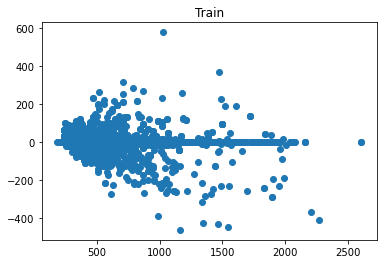

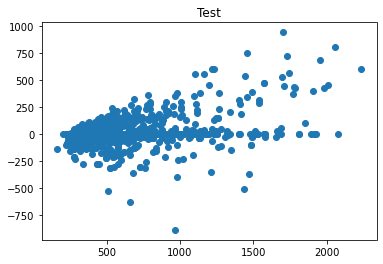

In [ ]:
print("Calibration Score:")
print(mean_squared_error(model.predict(Xtrain3), ytrain2))
print("Test Score:")
print(mean_squared_error(model.predict(Xtest), ytest))
scatter(ytrain2, model.predict(Xtrain3)-ytrain2)
title("Train")
show()
scatter(ytest, ytest - model.predict(Xtest))
title("Test")
show()